In [1]:
import tensorflow as tf
print(tf.VERSION)
print(tf.test.is_built_with_cuda())

/home/yujunhyung/anaconda3/envs/tf18/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


1.8.0
True


In [2]:
import keras
keras.__version__

Using TensorFlow backend.


'2.2.4'

In [3]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]= '0'

from keras import backend as K
config = tf.ConfigProto()
config.gpu_options.allow_growth=True
sess = tf.Session(config=config)
K.set_session(sess)

In [4]:
import numpy as np
import pandas as pd
import scipy.io
import cv2
import matplotlib.pyplot as plt
#from keras.models import Sequential
from keras.layers.convolutional import Conv3D
from keras.layers.convolutional_recurrent import ConvLSTM2D
#from convolutional_recurrent_test import ConvLSTM2D

#from keras.layers.normalization import BatchNormalization
from keras.layers import Input, LSTM, Dense, MaxPooling2D, TimeDistributed, UpSampling2D, concatenate, Dropout,BatchNormalization, merge
from keras.models import Model, Sequential
from keras.utils.vis_utils import plot_model
from keras.layers.convolutional import Conv2D
from sklearn import metrics
from keras.models import load_model

from astropy.convolution import convolve, Gaussian1DKernel, Box1DKernel
from tqdm import tnrange, tqdm
from operator import itemgetter
from itertools import *

In [5]:
multi_gpus_model = load_model('./runs/dataset_avenue_image_size_224_timesteps_4_epochs_100_model_convLSTM_res_attention_pred_checkname_convLSTM_res_attention_pred/convLSTM_res_attention_pred/100-0.00006166.hdf5')

In [6]:
def Y_label_generator(dataset=False):
   
    if dataset == 'avenue':
        Y_label = dict()
        video_idx = 0
        video = np.sort(os.listdir('./data/Avenue Dataset/testing_frames/'))
        gt = scipy.io.loadmat('./data/Avenue Dataset/' + 'gt_avenue.mat')

        for file in ['{}_label.mat'.format(i) for i in range(1,22)]:
            mask_file = scipy.io.loadmat('./data/Avenue Dataset/testing_label_mask/' + file)
            mask_file = mask_file['volLabel']
            len_file = mask_file.shape[-1] 

            
            Y_label_temp =  np.array([0 for _ in range(len_file)])

            for k in range(gt['gt'][0][video_idx].shape[-1]):
                Y_label_temp[gt['gt'][0][video_idx][0][k]:gt['gt'][0][video_idx][1][k]] = 1
                    
            print(file , ":", 'original length =', len_file)
            
            Y_label[video[video_idx]] = Y_label_temp
            video_idx += 1
  
    elif dataset == 'ped1' :
        test_videos_path = './data/UCSD_Anomaly_Dataset/UCSD_Anomaly_Dataset.v1p2/UCSDped1/'
        test_video_list = np.sort([folder for folder in os.listdir(os.path.join(test_videos_path,'Test')) if 'Test' in folder if 'gt' not in folder])
        
        Y_label = dict()
        gt = scipy.io.loadmat('./data/UCSD_Anomaly_Dataset/' + 'gt_ped1.mat')
        
        video_idx = 0
        for video in test_video_list:
            video_frames = np.sort([file for file in os.listdir(os.path.join(test_videos_path,'Test',video)) if 'tif' in file])
            video_length = len(video_frames)
            
            Y_label_temp =  np.array([0 for _ in range(video_length)])
            
            for i in range(gt['gt'][0][video_idx].shape[-1]):
                Y_label_temp[gt['gt'][0][video_idx][0][i]:gt['gt'][0][video_idx][1][i]] = 1
            
            Y_label[video] = Y_label_temp
            print(video , ":", 'original length =', video_length)
            video_idx += 1
            
    elif dataset == 'ped2' :
        test_videos_path = './data/UCSD_Anomaly_Dataset/UCSD_Anomaly_Dataset.v1p2/UCSDped2/'
        test_video_list = np.sort([folder for folder in os.listdir(os.path.join(test_videos_path,'Test')) if 'Test' in folder if 'gt' not in folder])
        
        Y_label = dict()
        gt = scipy.io.loadmat('./data/UCSD_Anomaly_Dataset/' + 'gt_ped2.mat')
        
        video_idx = 0
        for video in test_video_list:
            video_frames = np.sort([file for file in os.listdir(os.path.join(test_videos_path,'Test',video)) if 'tif' in file])
            video_length = len(video_frames)
            
            Y_label_temp =  np.array([0 for _ in range(video_length)])
            
            for i in range(gt['gt'][0][video_idx].shape[-1]):
                Y_label_temp[gt['gt'][0][video_idx][0][i]:gt['gt'][0][video_idx][1][i]] = 1
            
            Y_label[video] = Y_label_temp
            print(video , ":", 'original length =', video_length)
            video_idx += 1
                    
        
    
        
    return Y_label

In [7]:
label = Y_label_generator('avenue')

1_label.mat : original length = 1439
2_label.mat : original length = 1211
3_label.mat : original length = 923
4_label.mat : original length = 947
5_label.mat : original length = 1007
6_label.mat : original length = 1283
7_label.mat : original length = 605
8_label.mat : original length = 36
9_label.mat : original length = 1175
10_label.mat : original length = 841
11_label.mat : original length = 472
12_label.mat : original length = 1271
13_label.mat : original length = 549
14_label.mat : original length = 507
15_label.mat : original length = 1001
16_label.mat : original length = 740
17_label.mat : original length = 426
18_label.mat : original length = 294
19_label.mat : original length = 248
20_label.mat : original length = 273
21_label.mat : original length = 76


# Calculate anomaly score using trained model

In [8]:
def calc_mse(dataset = 'ped1', image_size = 224, stride = 1, timesteps = 4, batch_size = 33):
    if dataset =='avenue':
        test_videos_path = './data/Avenue Dataset/testing_frames/'
    elif dataset == 'ped1' :
        test_videos_path = './data/UCSD_Anomaly_Dataset/UCSD_Anomaly_Dataset.v1p2/UCSDped1/'
    elif dataset == 'ped2' :
        test_videos_path = './data/UCSD_Anomaly_Dataset/UCSD_Anomaly_Dataset.v1p2/UCSDped2/'
    elif dataset == 'enter' :
        test_videos_path = './data/subway/enter/testing_frames/'
    elif dataset == 'exit' :
        test_videos_path = './data/subway/exit/testing_frames/'    
        
    all_mse = dict()
    if dataset =='avenue' or dataset == 'enter' or dataset == 'exit':
        test_video_list = np.sort(os.listdir(test_videos_path))
    elif dataset == 'ped1' or dataset == 'ped2':
        test_video_list = np.sort([folder for folder in os.listdir(os.path.join(test_videos_path,'Test')) if 'Test' in folder if 'gt' not in folder])
    
    for video in test_video_list :
        print('check video name : ', video)
        
        resized_frames =[]
        
        
        if dataset =='avenue' or dataset == 'enter' or dataset == 'exit':
            f_len = len(os.listdir(os.path.join(test_videos_path,video)))
            video_frames = [str(file) + '.jpg' for file in list(range(f_len))]
        elif dataset == 'ped1' or dataset == 'ped2':    
            video_frames = np.sort([file for file in os.listdir(os.path.join(test_videos_path,'Test',video)) if 'tif' in file])
            f_len = len(video_frames)
        
        end_idx = (f_len//stride) * stride -1
        while end_idx + timesteps -1 > f_len -1 :
            end_idx -= stride 
            
        num_sample = (end_idx+1)//stride    
            
        mse = []    
        if num_sample%batch_size ==0:
            cnt = num_sample//batch_size
        else : cnt = num_sample//batch_size+1
        for i in tnrange(cnt, desc='test : {}'.format(video)) :
            
            batch = []
            batch_y = []
            
            for sequence_start_idx in list(range(1,end_idx, stride))[i*batch_size:i*batch_size+batch_size]:
                resized_frames = [] # sequence
                
                sequence = video_frames[sequence_start_idx-1:sequence_start_idx+timesteps+1] # [t-1 , t , t+1, t+2]
            
                # t-1 sample 
                if dataset =='avenue' or dataset == 'enter' or dataset == 'exit':
                    prv = scipy.misc.imread(os.path.join(test_videos_path,video,sequence[0]), mode='L')
                                            
                elif dataset == 'ped1' or dataset =='ped2':
                    prv = scipy.misc.imread(os.path.join(test_videos_path,'Test',video, sequence[0]), mode='L')
    
                prv = scipy.misc.imresize(prv, (image_size,image_size))
        
                if dataset =='avenue' or dataset == 'enter' or dataset == 'exit':
                    frame_y = scipy.misc.imread(os.path.join(test_videos_path,video,sequence[-1]), mode='L')
                                            
                elif dataset == 'ped1' or dataset =='ped2':
                    frame_y = scipy.misc.imread(os.path.join(test_videos_path,'Test',video, sequence[-1]), mode='L')
                    
                frame_y = scipy.misc.imresize(frame_y, (image_size,image_size))
                batch_y.append(frame_y)
                # t , t+1, t+2 sample
                for name in sequence[1:-1]:
                    if dataset =='avenue' or dataset == 'enter' or dataset == 'exit':
                        nxt = scipy.misc.imread(os.path.join(test_videos_path,video,name), mode='L')
                    elif dataset == 'ped1' or dataset == 'ped2':
                        nxt = scipy.misc.imread(os.path.join(test_videos_path,'Test',video,name), mode='L') # 'L = gray'                     
        
                    nxt = scipy.misc.imresize(nxt, (image_size,image_size))
                                            
                    flow = cv2.calcOpticalFlowFarneback(prv,nxt, None, 0.5, 3, 15, 3, 5, 1.2, 0)
                    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])

                    hsv = np.zeros((image_size,image_size,3))
                    hsv[...,1] = 255.  
                    hsv[...,0] = ang*180/np.pi/2
                    hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
                    hsv = np.uint8(hsv) 

                    rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)
                    rgb = rgb/255.             
                    
                    nxt = np.expand_dims(nxt, axis=-1)
                    frame = np.concatenate([nxt/255.,rgb],axis = -1)                        
                    resized_frames.append(frame)
                    prv = nxt.copy()                        
                                            
                resized_frames = np.stack(resized_frames, axis=0)
                batch.append(resized_frames)
                
            batch = np.stack(batch, axis = 0)
            batch_y = np.stack(batch_y, axis = 0)
            batch_y = np.expand_dims(batch_y/255., axis=-1)
            
            # batch prediction                            
            pred_batch = multi_gpus_model.predict_on_batch(batch)

            # MSE 
            mse_batch = np.square(batch_y-pred_batch).mean(-1)
            mse_batch = np.ndarray.max(mse_batch,axis=(1,2))
            mse.append(mse_batch)       
                                            
        mse = np.concatenate(mse, axis=0)
        mse = mse.reshape((-1))          
                                            
        # plot
        # label maker
        label_each, = np.where(label[video] == 1)
        groups = []
        for k, g in groupby(enumerate(label_each), lambda x: x[0]-x[1]):
            groups.append(list(map(itemgetter(1), g)))
        
        plt.figure(figsize=(20,5))
        plt.xlabel('Frame number')
        plt.ylabel('Nomalized MSE')
        plt.title('{} video #{}'.format(dataset, video))
        plt.plot(mse)
        for i in range(len(groups)):
            plt.axvspan(groups[i][0] , groups[i][-1], facecolor='r', alpha=0.2)
        plt.show()
        
        # mse add
        all_mse[video] = mse
        
    return all_mse

check video name :  01


/home/yujunhyung/anaconda3/envs/tf18/lib/python3.6/site-packages/ipykernel/__main__.py:55: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/home/yujunhyung/anaconda3/envs/tf18/lib/python3.6/site-packages/ipykernel/__main__.py:60: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/yujunhyung/anaconda3/envs/tf18/lib/python3.6/site-packages/ipykernel/__main__.py:63: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/home/yujunhyung/anaconda3/envs/tf18/lib/python3.6/site-packages/ipykernel/__main__.py:68: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/yujunhyung/anaconda3/e

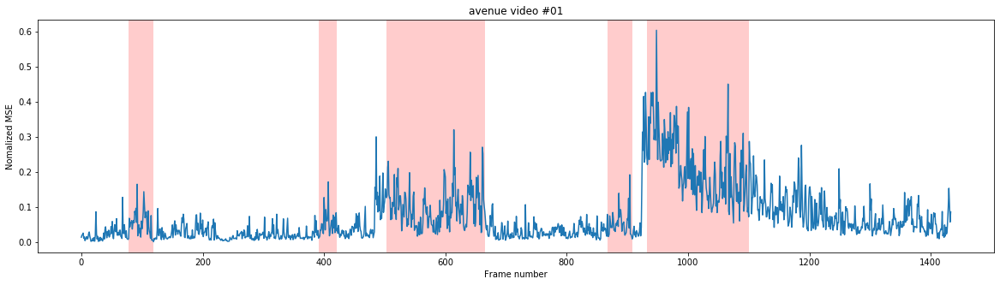

check video name :  02


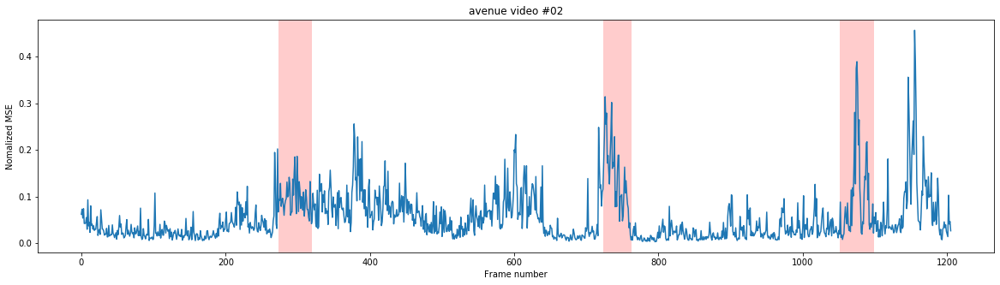

check video name :  03


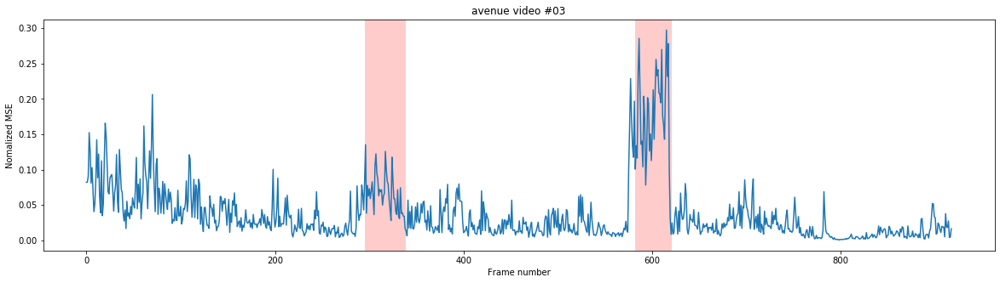

check video name :  04


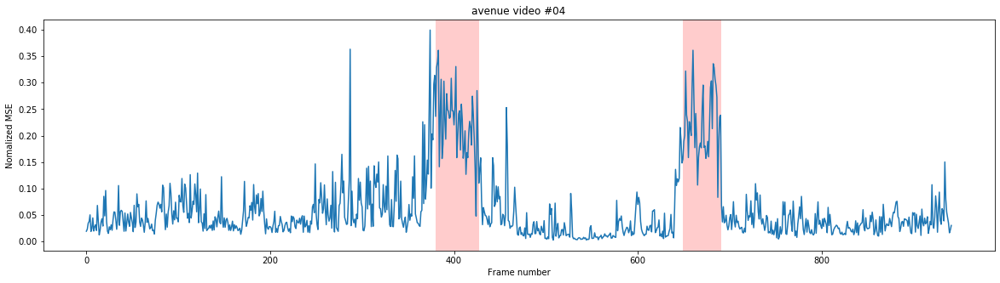

check video name :  05


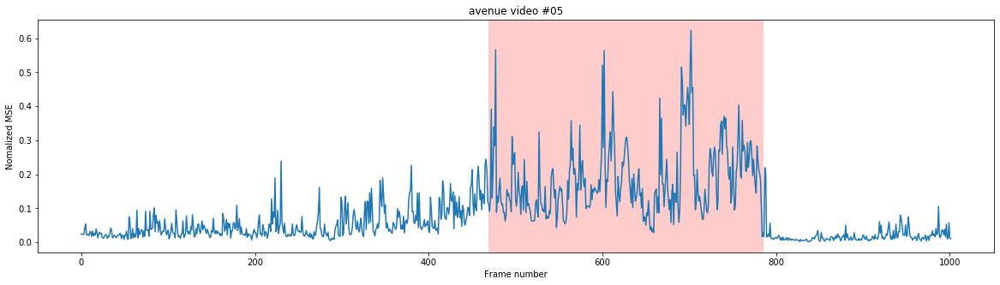

check video name :  06


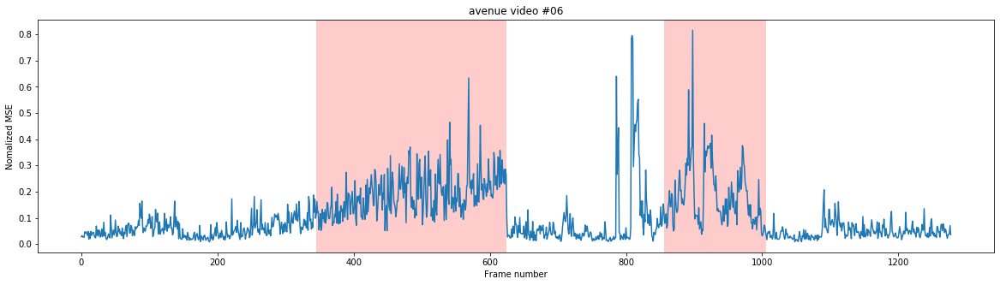

check video name :  07


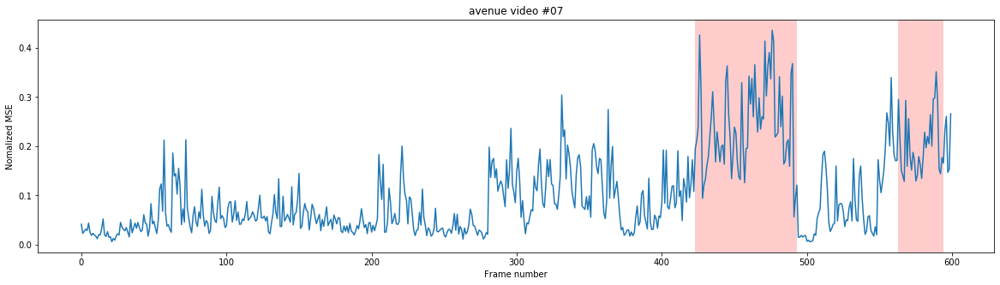

check video name :  08


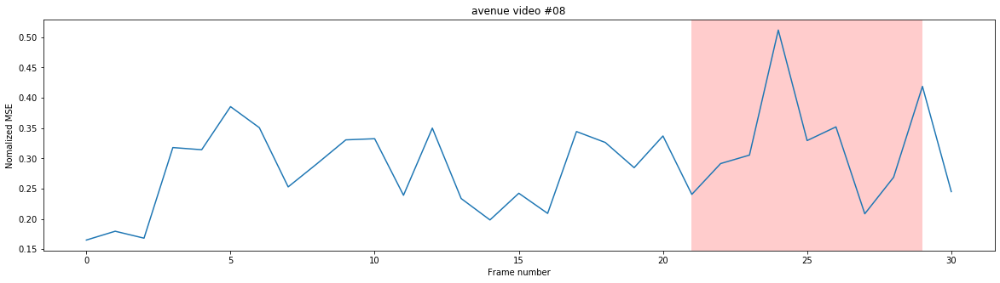

check video name :  09


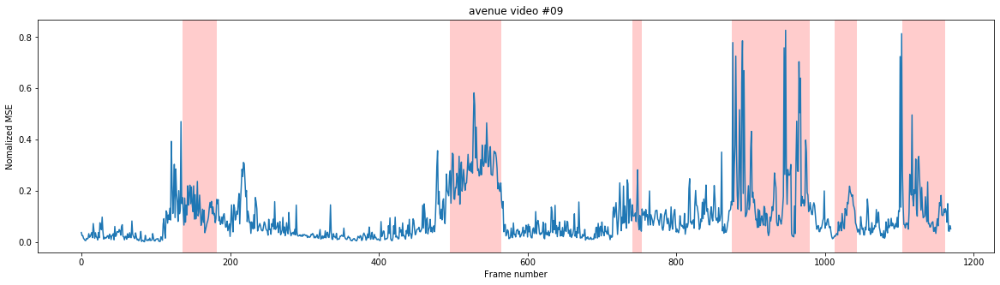

check video name :  10


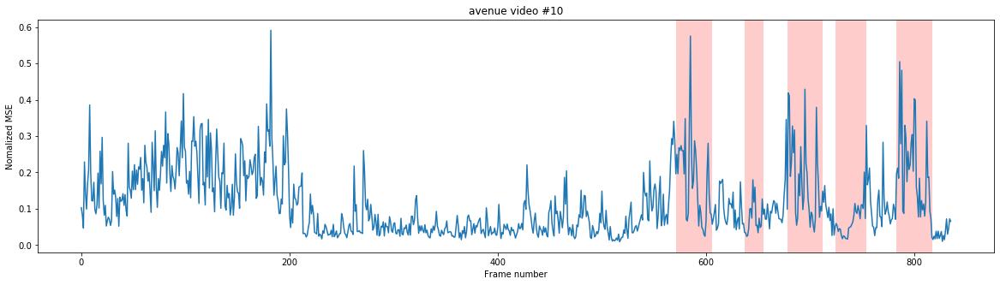

check video name :  11


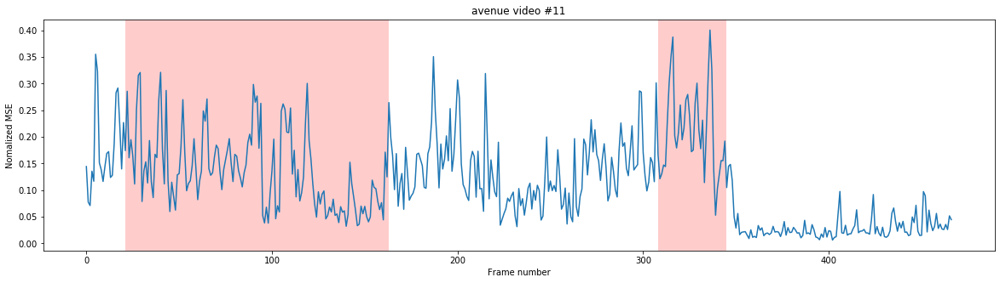

check video name :  12


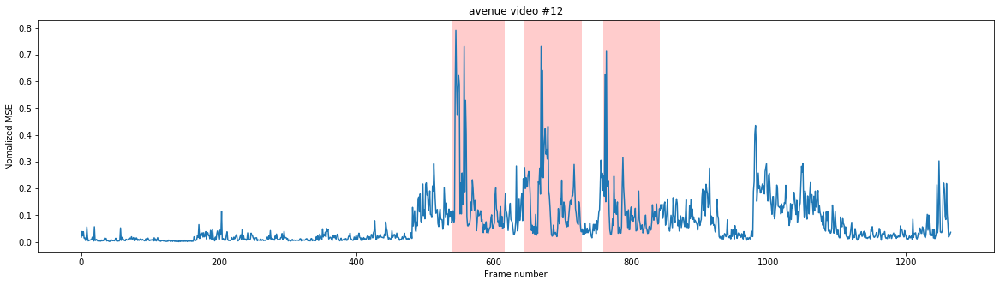

check video name :  13


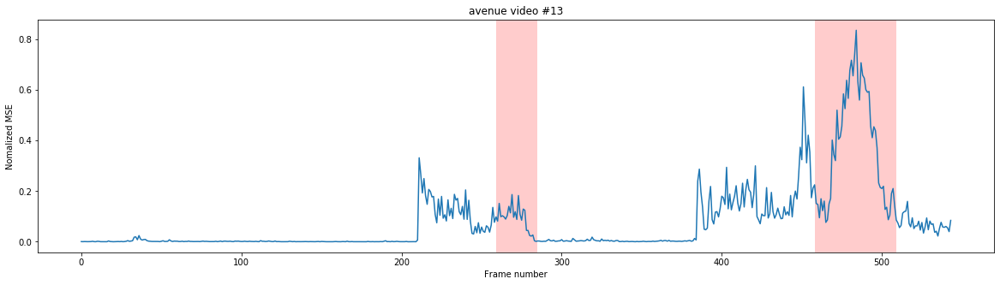

check video name :  14


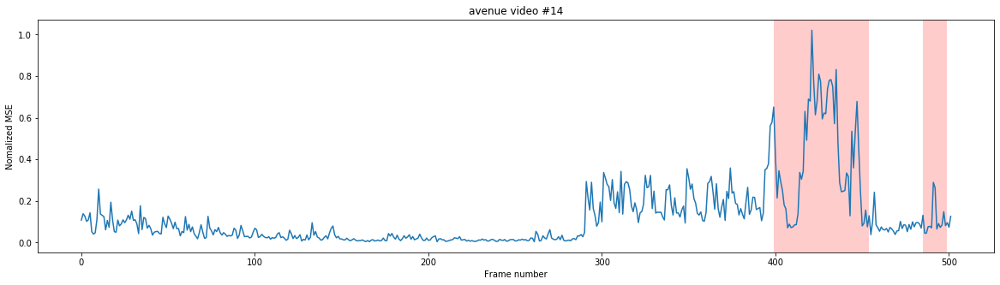

check video name :  15


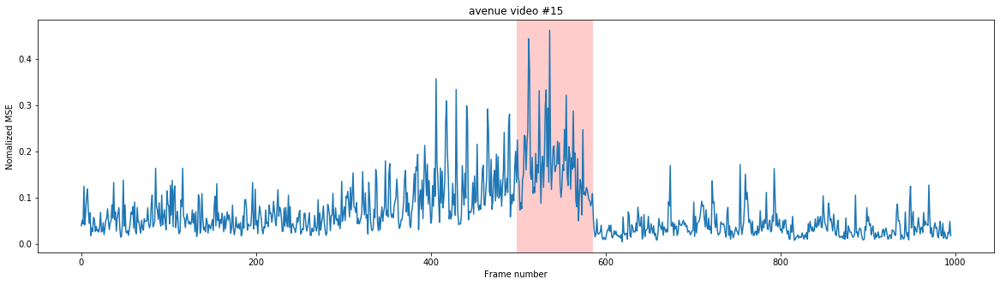

check video name :  16


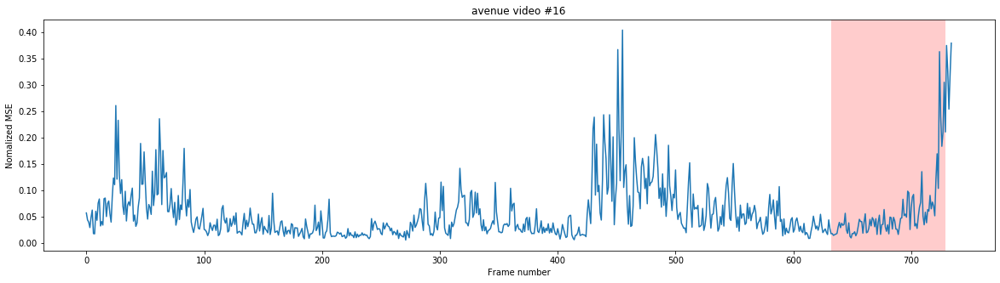

check video name :  17


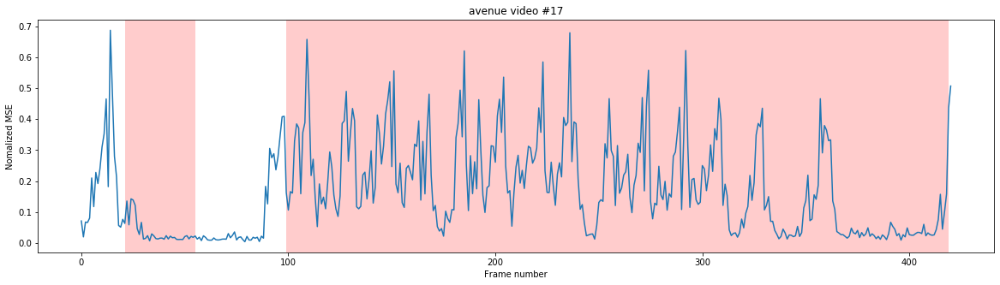

check video name :  18


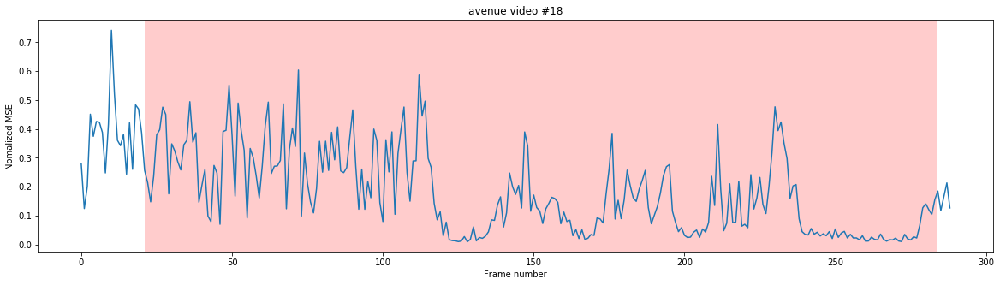

check video name :  19


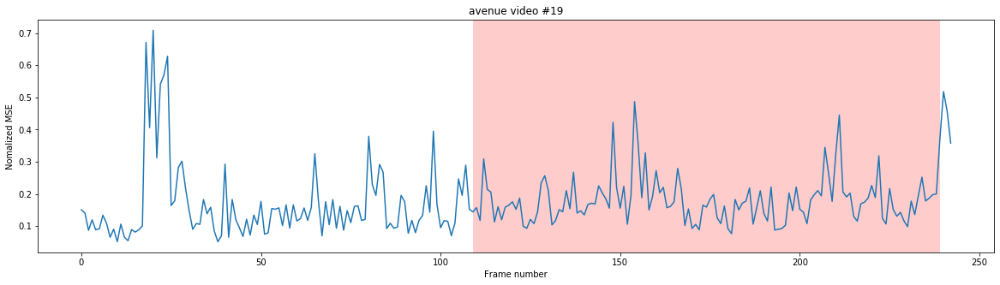

check video name :  20


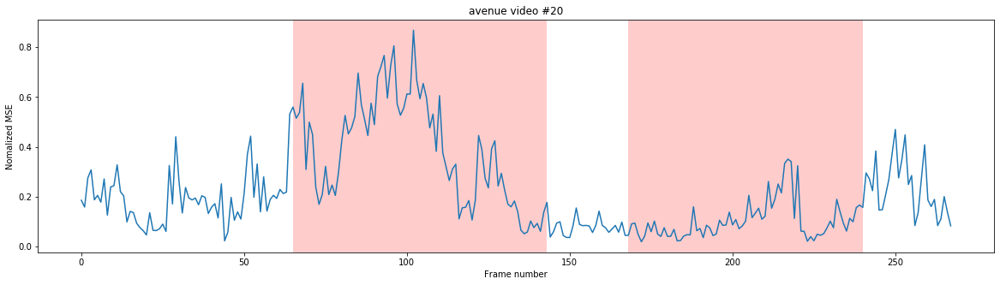

check video name :  21


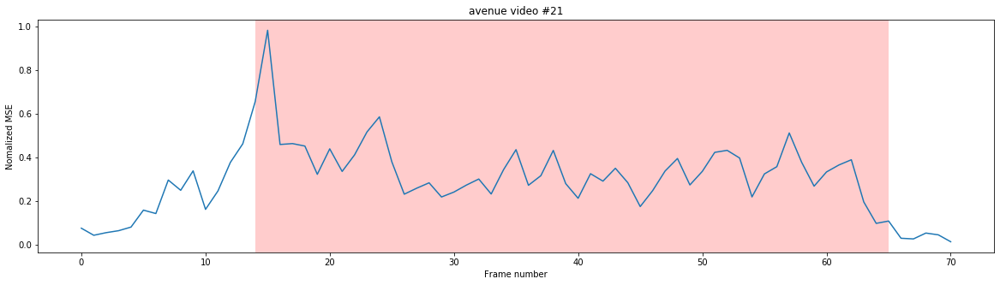

In [9]:
mse = calc_mse('avenue')

# before Post-process

In [9]:
all_mse = np.concatenate([mse[video] for video in np.sort(list(mse.keys()))])
all_label = np.concatenate([label[video][5:] for video in np.sort(list(mse.keys()))] )

In [11]:
fpr, tpr, thresholds = metrics.roc_curve(all_label,all_mse, pos_label=1)
print(metrics.auc(fpr, tpr))

0.8306966970097955


# moving MSE

In [14]:
score = []
for i in range(1,20):
    all_m_mse = []
    for video in np.sort(list(mse.keys())):
        df_mse = pd.DataFrame(mse[video])
        m_mse = df_mse.rolling(i, min_periods = 1).mean()
        m_mse = m_mse.values[:,0]

        all_m_mse.append(m_mse)
        
    all_m_mse = np.concatenate(all_m_mse)    
    fpr, tpr, thresholds = metrics.roc_curve(all_label,all_m_mse, pos_label=1)
    print(metrics.auc(fpr, tpr))
    score.append(metrics.auc(fpr, tpr))
    
max_idx = np.argmax(score)

0.8306966855272049
0.8409677251931257
0.8465545108439291
0.8505753007635005
0.8537673691409507
0.8564728053209406
0.8589184593670153
0.8609646111145047
0.8627345146928935
0.864388375208811
0.8658428979487041
0.8671133317931351
0.868159717326173
0.8690264692089735
0.8698072853823404
0.8704079626714754
0.8708133670217237
0.8710918887438
0.8712862890057868


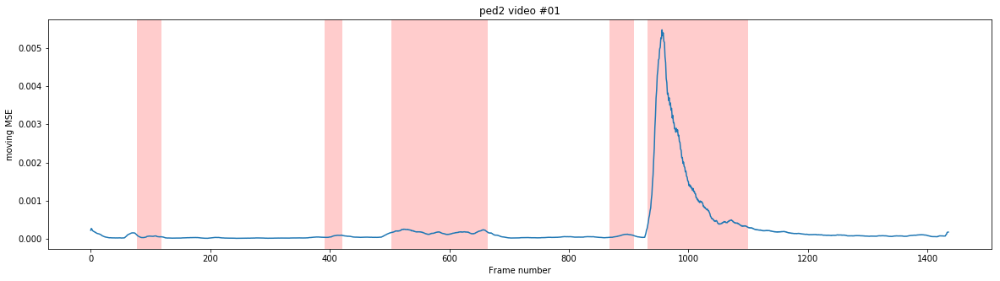

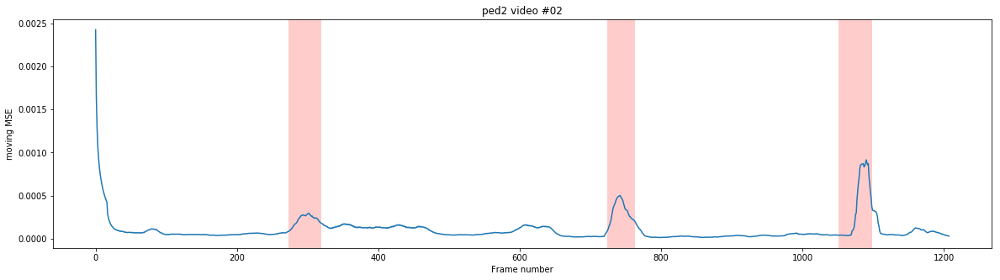

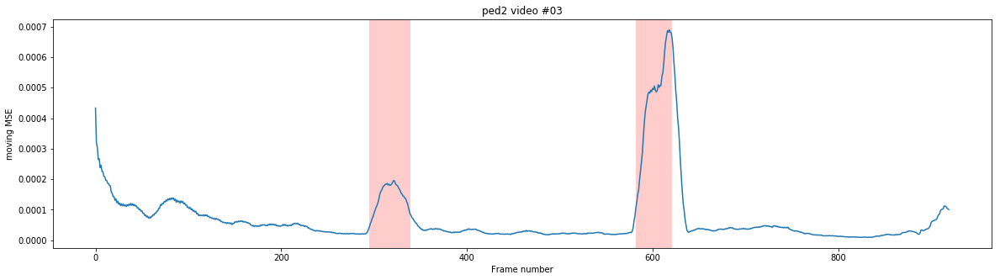

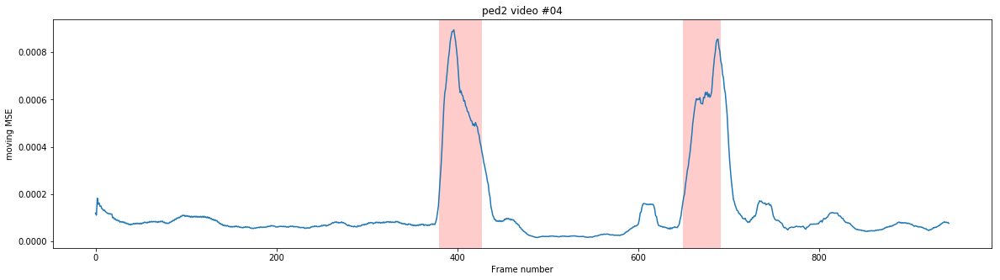

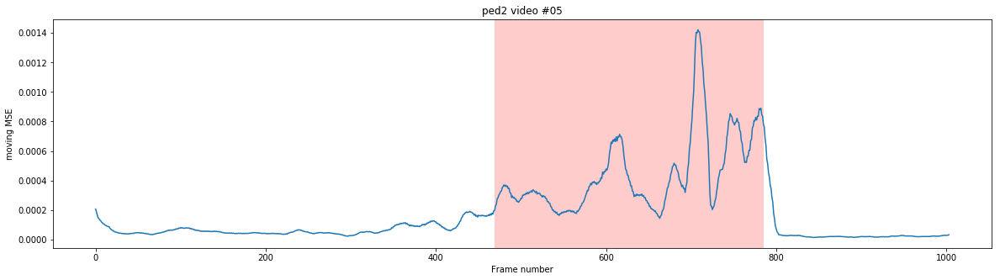

...

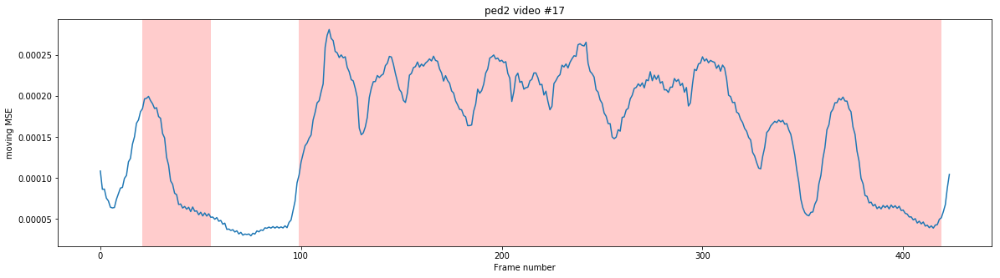

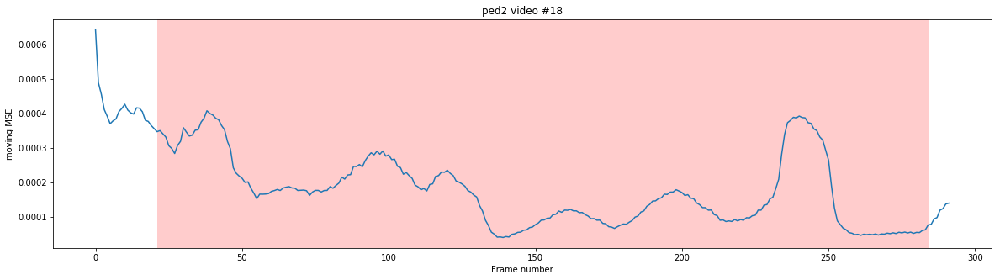

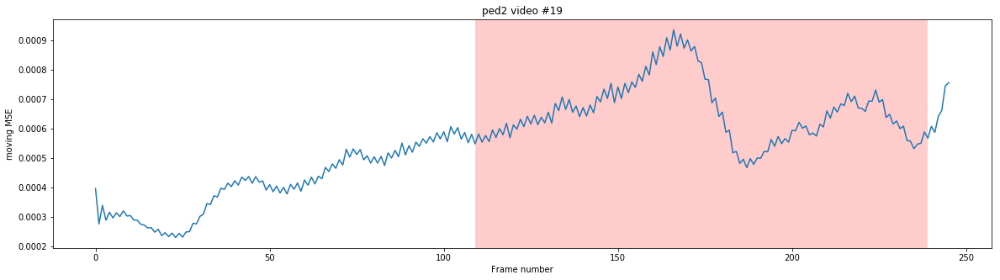

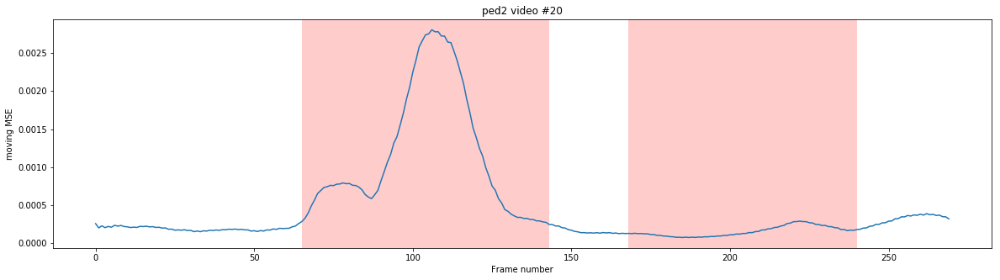

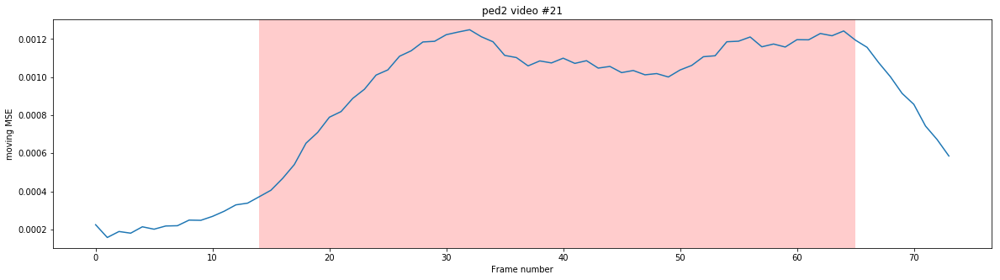

0.8604866164692798


In [15]:
for i in [max_idx+1]:
    all_m_mse = []
    for video in np.sort(list(mse.keys())):
        df_mse = pd.DataFrame(mse[video])
        m_mse = df_mse.rolling(i, min_periods = 1).mean()
        m_mse = m_mse.values[:,0]

        all_m_mse.append(m_mse)
        
        
        label_each, = np.where(label[video] == 1)
        groups = []
        for k, g in groupby(enumerate(label_each), lambda x: x[0]-x[1]):
            groups.append(list(map(itemgetter(1), g)))

        plt.figure(figsize=(20,5))
        plt.xlabel('Frame number')
        plt.ylabel('moving MSE')
        plt.title('ped2 video #{}'.format(video))
        plt.plot(m_mse)
        for j in range(len(groups)):
            plt.axvspan(groups[j][0] , groups[j][-1], facecolor='r', alpha=0.2)
        plt.show()
        
    all_m_mse = np.concatenate(all_m_mse)    
    fpr, tpr, thresholds = metrics.roc_curve(all_label,all_m_mse, pos_label=1)
    print(metrics.auc(fpr, tpr))

# gaussian MSE

In [27]:
score = []
for i in range(1,100):
    all_g_mse = []
    for video in np.sort(list(mse.keys())):

        gauss_kernel = Gaussian1DKernel(i)
        g_mse = convolve(mse[video], gauss_kernel)
        all_g_mse.append(g_mse)
    all_g_mse = np.concatenate(all_g_mse)    
    fpr, tpr, thresholds = metrics.roc_curve(all_label,all_g_mse, pos_label=1)
    print(metrics.auc(fpr, tpr))
    score.append(metrics.auc(fpr, tpr))
    
max_idx = np.argmax(score)

0.8496283085362959
0.8605816437466499
0.8683149160232206
0.8741026240475764
0.8784080903578848
0.8816835453096142
0.8841238484683831
0.8860454600362206
0.8875461427910688
0.8887234757894167
0.8896393042652313
0.8902372257325777
0.8905885470802298
0.8907667339240285
0.8907793647738917
0.8906649752044934
0.8904860534748845
0.8902716275745691
0.8900038076271043
0.8896880134153405
0.8892808177809297
0.8888086306826768
0.8883579160291915
0.8878856830005755
0.8873472183883128
0.8868149543750737
0.8862081453824597
0.8855754316650353
0.884934174900067
0.8842871768397063
0.8836214621563663
0.8829036165108632
0.8821416777167465
0.8813654775448753
0.8806033550293058
0.8798481909637522
0.8791071275196822
0.8783688198974007
0.8776310864046584
0.8769274791717288
0.8762162704636992
0.8755230434928389
0.8748106635605493
0.8740776838603919
0.8733244948004533
0.8725719487655985
0.8718227097168899
0.8710626311024802
0.8703182836374459
0.8696139185535242
0.8689208982692981
0.8682257192580043
0.86749414043

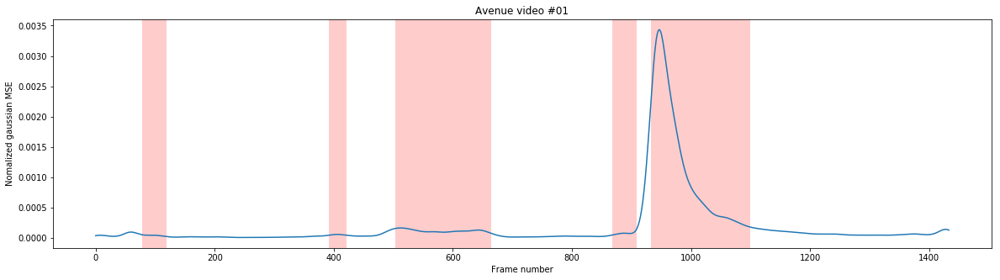

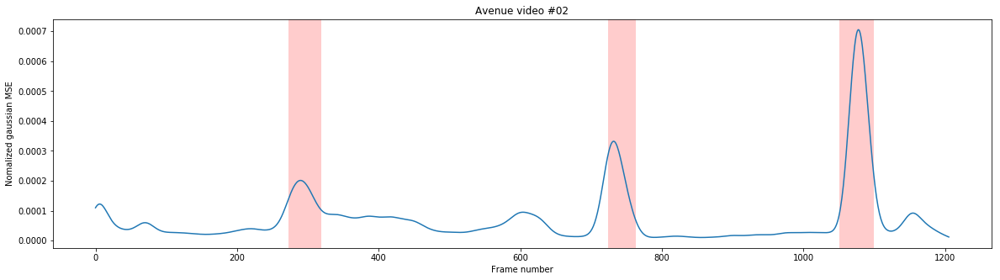

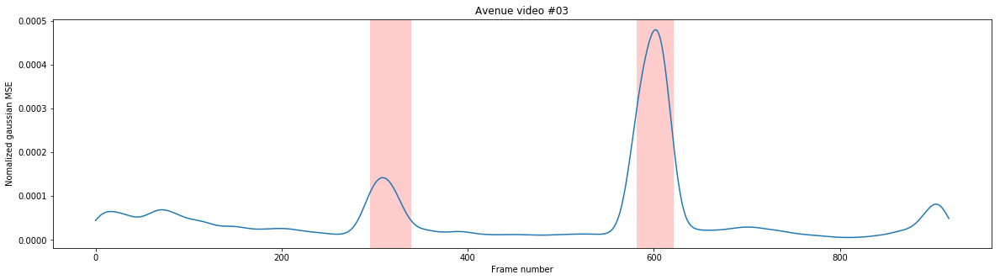

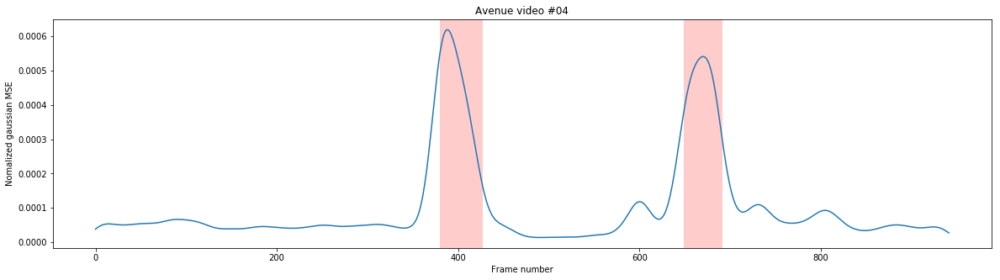

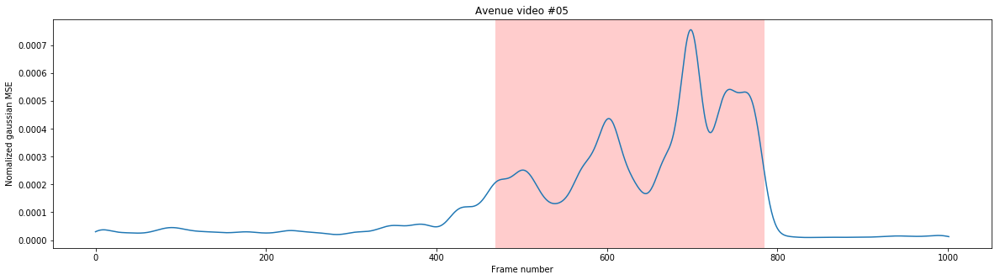

...

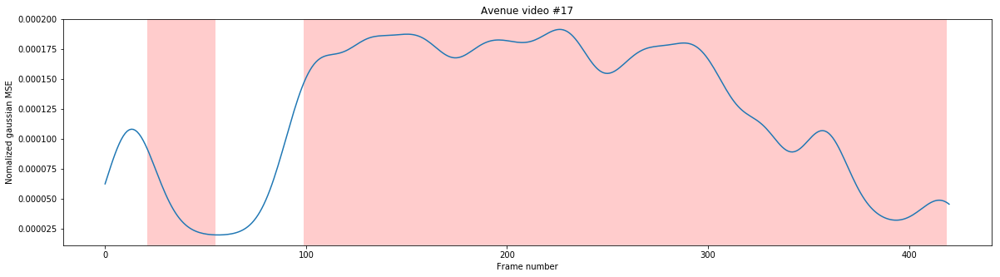

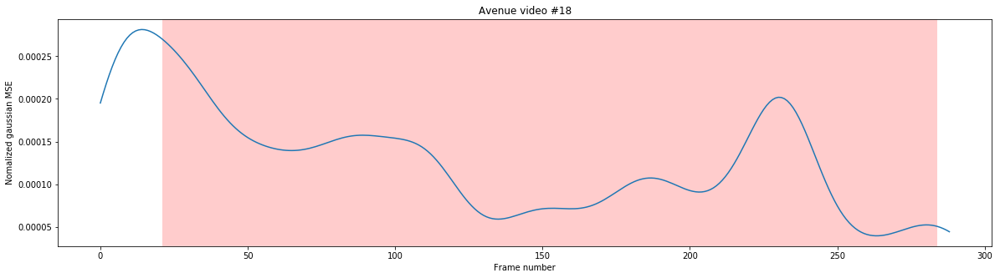

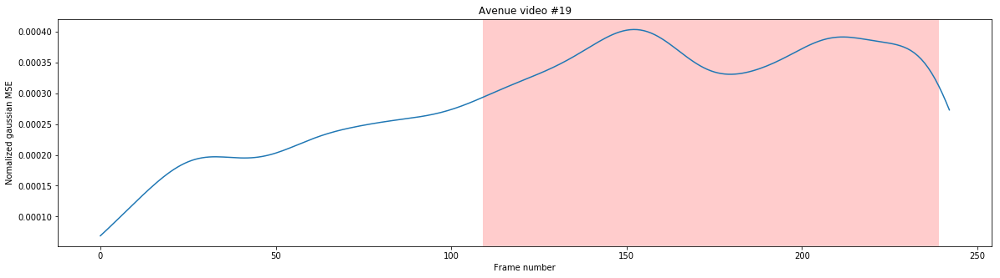

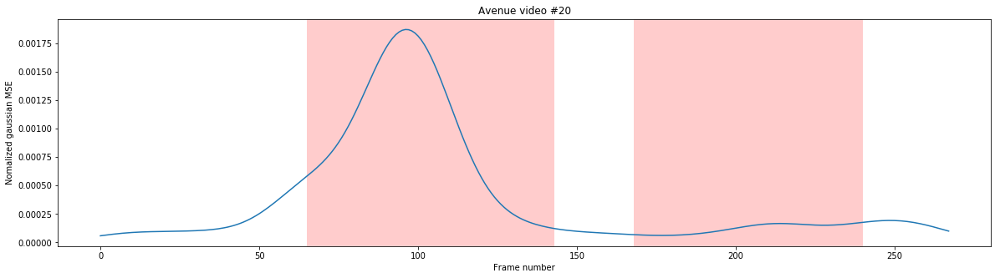

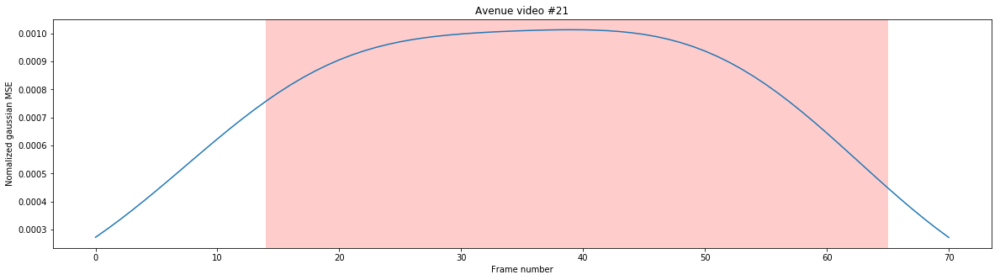

0.8835875655483696
0.18598122642473322


In [15]:
for i in [max_idx+1]:
    all_g_mse = []
    for video in np.sort(list(mse.keys())):

        gauss_kernel = Gaussian1DKernel(i)
        g_mse = convolve(mse[video], gauss_kernel)

        all_g_mse.append(g_mse)
        
        label_each, = np.where(label[video] == 1)
        groups = []
        for k, g in groupby(enumerate(label_each), lambda x: x[0]-x[1]):
            groups.append(list(map(itemgetter(1), g)))
        
        plt.figure(figsize=(20,5))
        plt.xlabel('Frame number')
        plt.ylabel('Nomalized gaussian MSE')
        plt.title('Avenue video #{}'.format(video))
        plt.plot(g_mse)
        for j in range(len(groups)):
            plt.axvspan(groups[j][0] , groups[j][-1], facecolor='r', alpha=0.2)
        plt.show()
        
    all_g_mse = np.concatenate(all_g_mse)    
    fpr, tpr, thresholds = metrics.roc_curve(all_label,all_g_mse, pos_label=1)
    print(metrics.auc(fpr, tpr))
    score.append(metrics.auc(fpr, tpr))
    fpr, tpr, thresholds = roc_curve(all_label, all_g_mse, pos_label=1)

    eer = brentq(lambda x : 1. - x - interp1d(fpr, tpr)(x), 0., 1.)
    print(eer)


# temp visualize

In [5]:
# resize
def check_result(dataset = 'ped2',test_video_list = 'Test001', image_size = 224, stride = 2, timesteps = 3, batch_size = 30):
    if dataset =='avenue':
        test_videos_path = './data/Avenue Dataset/testing_frames/'
    elif dataset == 'ped1' :
        test_videos_path = './data/UCSD_Anomaly_Dataset/UCSD_Anomaly_Dataset.v1p2/UCSDped1/'
    elif dataset == 'ped2' :
        test_videos_path = './data/UCSD_Anomaly_Dataset/UCSD_Anomaly_Dataset.v1p2/UCSDped2/'
        
        
    all_mse = dict()

    for video in [test_video_list] :
        print('check video name : ', video)

        resized_frames =[]
        
        
        if dataset =='avenue':
            prv = scipy.misc.imread(os.path.join(test_videos_path,video,str(0))+'.jpg', mode='L')
        elif dataset =='ped1' or 'ped2':
            prv = scipy.misc.imread(os.path.join(test_videos_path,'Test',video,'001.tif'), mode='L')
            
        prv = scipy.misc.imresize(prv, (image_size,image_size))

        if dataset =='avenue':
            f_len = len(os.listdir(os.path.join(test_videos_path,video)))
            video_frames = [str(file) + '.jpg' for file in list(range(f_len))]
        elif dataset =='ped1' or 'ped2':    
            video_frames = np.sort([file for file in os.listdir(os.path.join(test_videos_path,'Test',video)) if 'tif' in file])
            f_len = len(video_frames)
        
        for name in video_frames[1:]:
            
            if dataset =='avenue':
                nxt = scipy.misc.imread(os.path.join(test_videos_path,video,name), mode='L')
            elif dataset =='ped1' or 'ped2':
                nxt = scipy.misc.imread(os.path.join(test_videos_path,'Test',video,name), mode='L') # 'L = gray'
                
            nxt = scipy.misc.imresize(nxt, (image_size,image_size))

            flow = cv2.calcOpticalFlowFarneback(prv,nxt, None, 0.5, 3, 15, 3, 5, 1.2, 0)
            mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])

            hsv = np.zeros((image_size,image_size,3))
            hsv[...,1] = 255.  
            hsv[...,0] = ang*180/np.pi/2
            hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
            hsv = np.uint8(hsv) 

            rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)
            rgb = rgb/255.

            nxt = np.expand_dims(nxt, axis=-1)
            frame = np.concatenate([nxt/255.,rgb],axis = -1)
            resized_frames.append(frame)
            prv = nxt.copy()

        # stacking 
        resized_frames = np.stack(resized_frames, axis=0)

        end_idx = (f_len//stride) * stride -1
        while end_idx + timesteps -1 > f_len -1 :
            end_idx -= stride 


        test = []
        for i in range(0,end_idx + 1,stride):
            test.append(resized_frames[i:i+timesteps ,: ,:,:])

        test = np.stack(test, axis=0)
        #test = np.expand_dims(test, -1)

        
    return test

In [6]:
test= check_result(dataset = 'avenue',test_video_list = '02', image_size = 224, stride = 2, timesteps = 3, batch_size = 30)

check video name :  02


/home/yujunhyung/anaconda3/envs/tf18/lib/python3.6/site-packages/scipy/misc/pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if issubdtype(ts, int):
/home/yujunhyung/anaconda3/envs/tf18/lib/python3.6/site-packages/scipy/misc/pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


In [35]:
batch = test[370:400]

In [36]:
pred_batch = multi_gpus_model.predict_on_batch(batch)
mse_batch = np.square(batch[:,1:,:,:,:1]-pred_batch)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


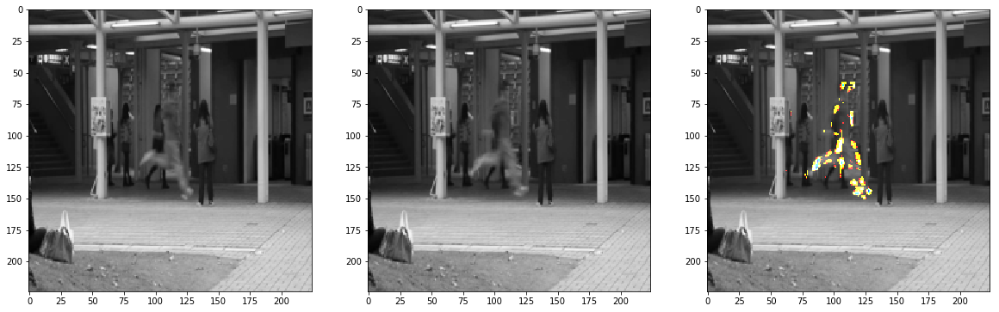

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


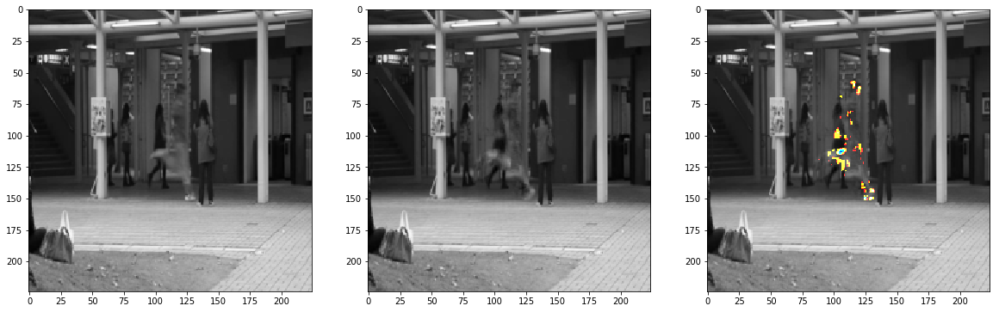

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


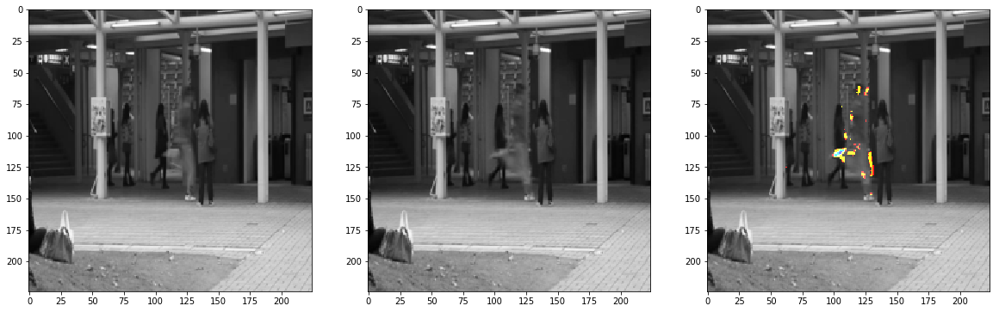

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


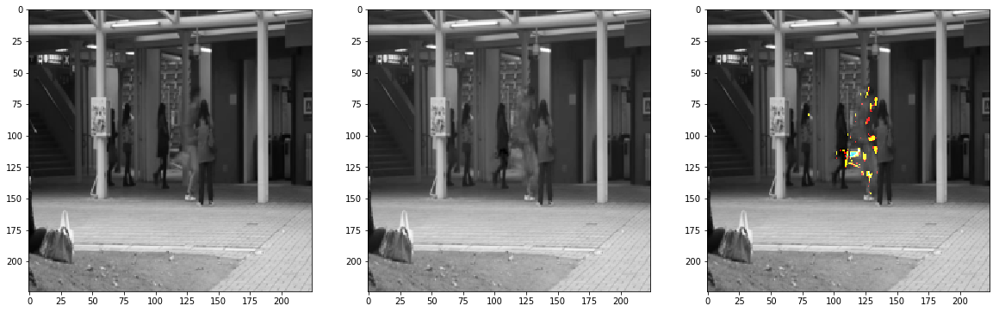

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


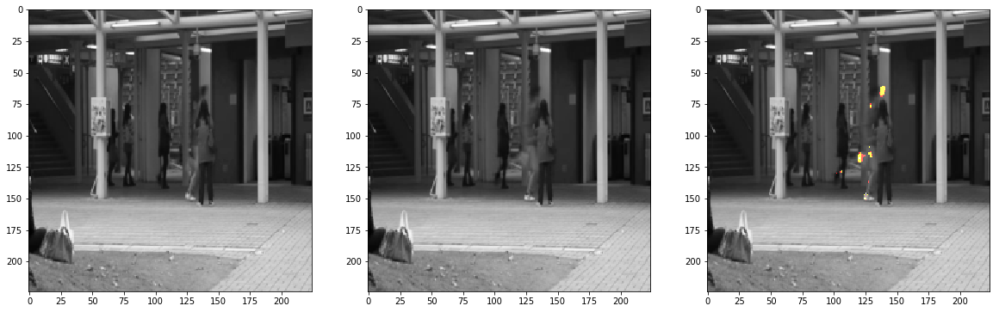

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


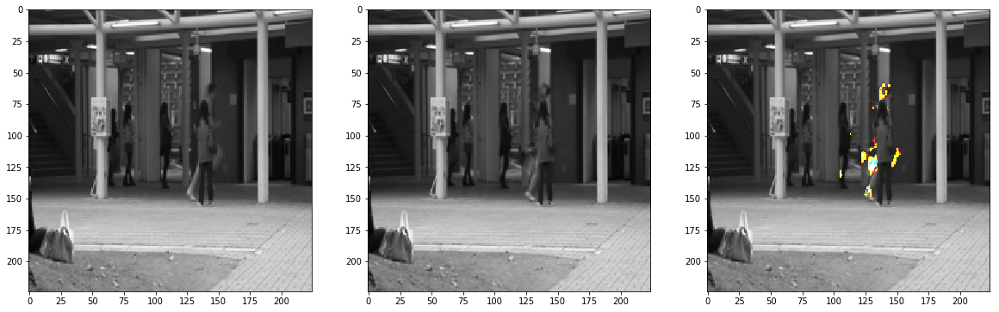

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


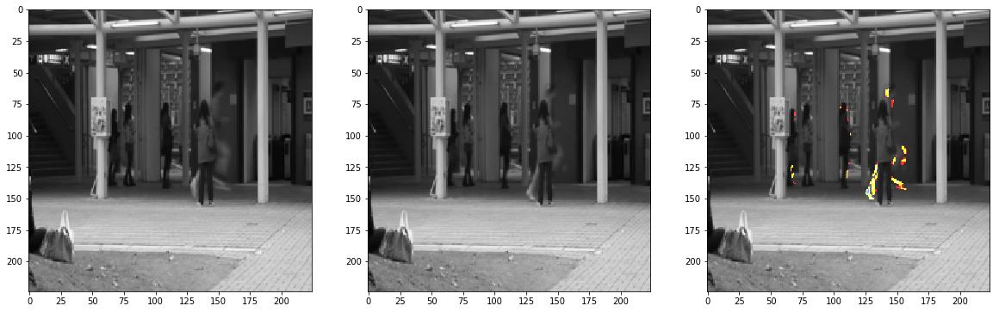

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


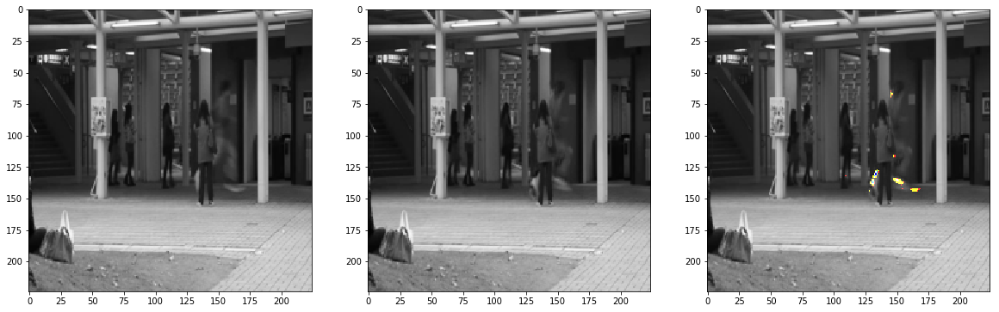

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


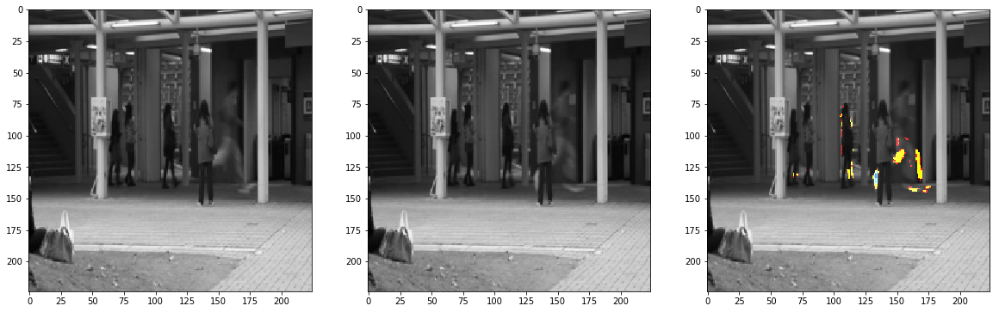

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


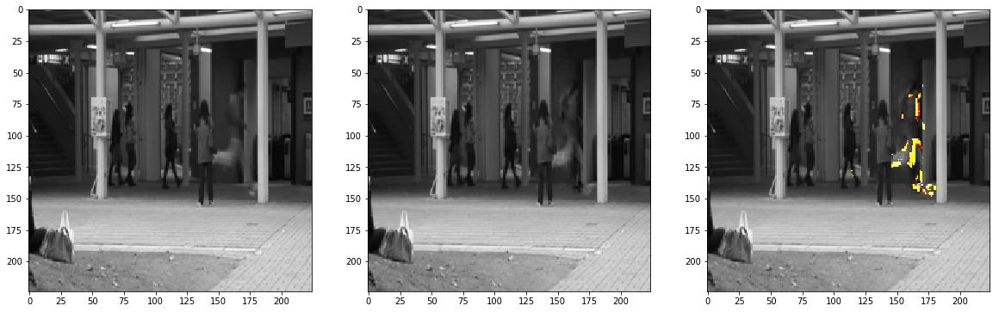

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


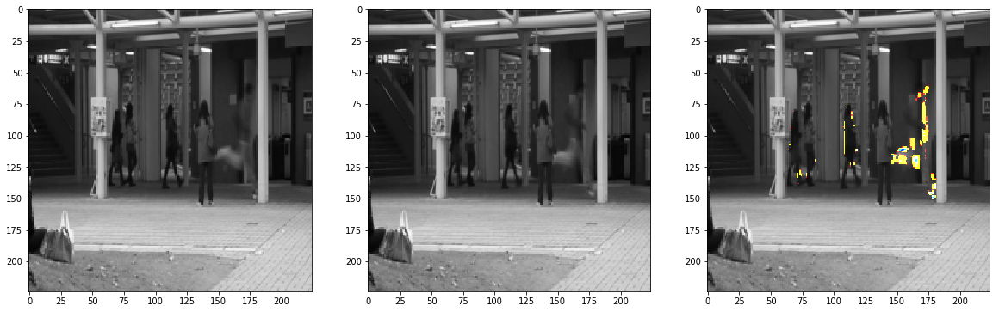

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


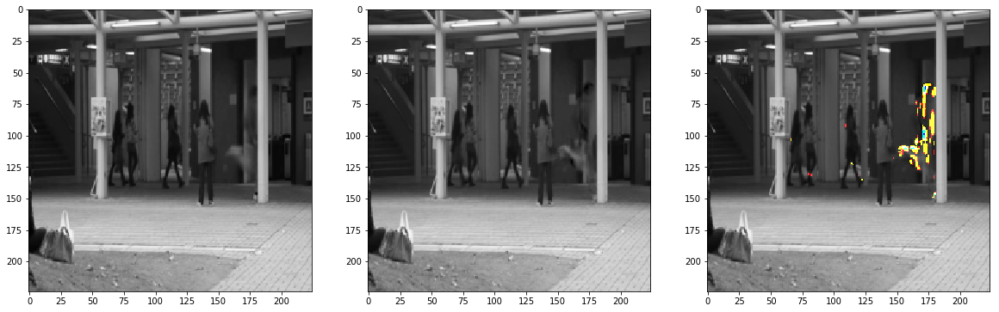

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


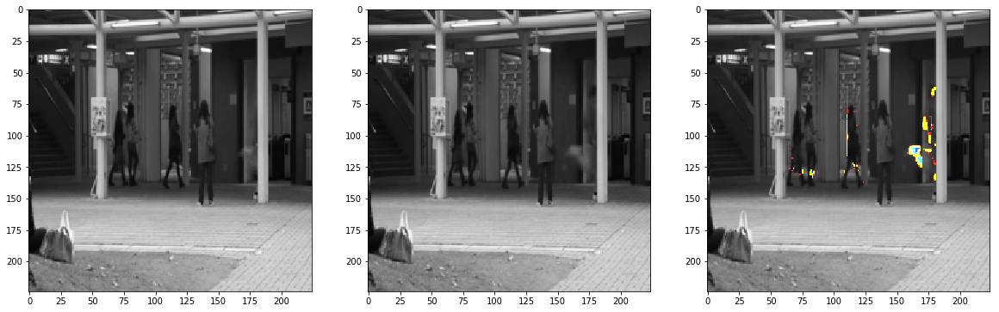

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


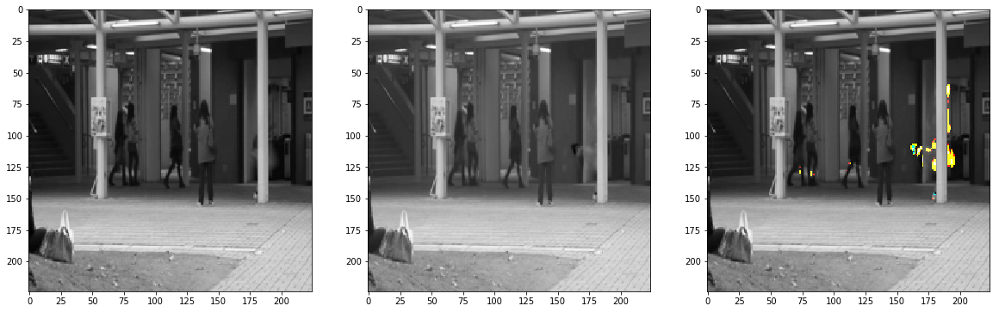

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


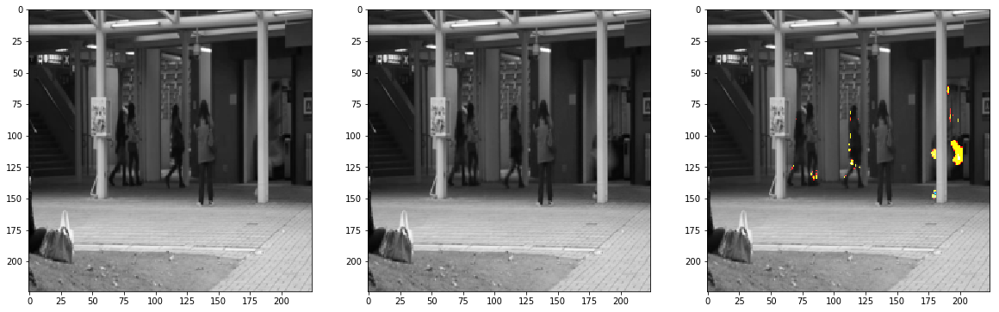

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


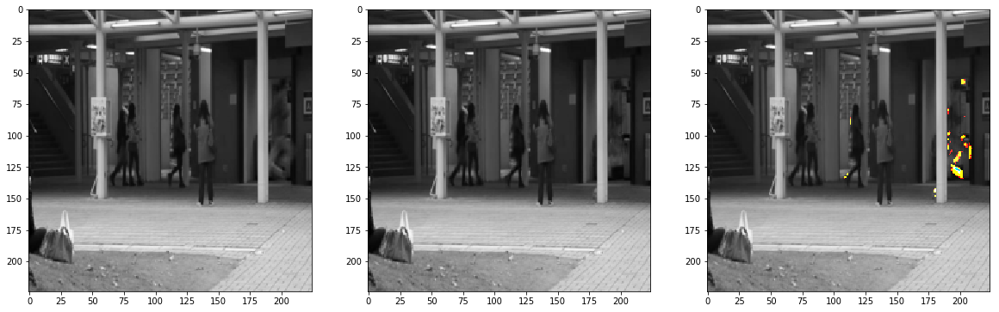

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


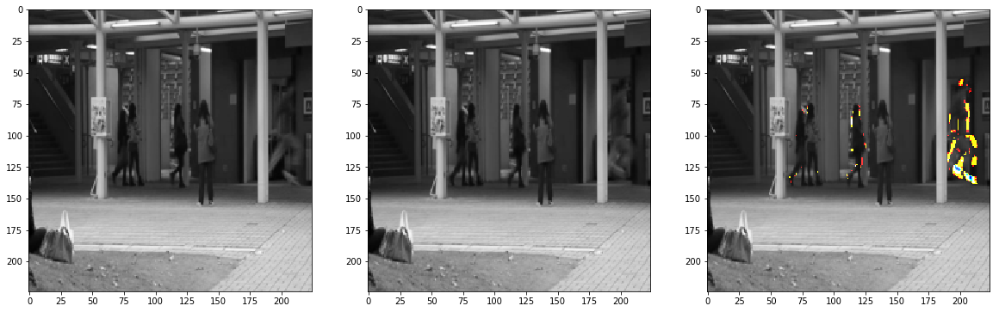

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


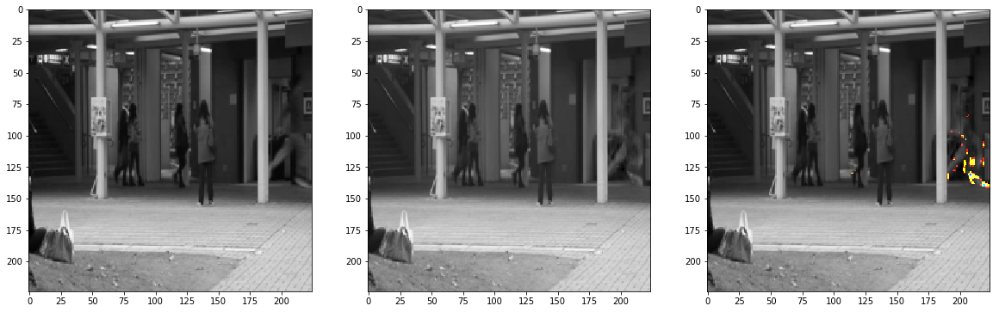

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


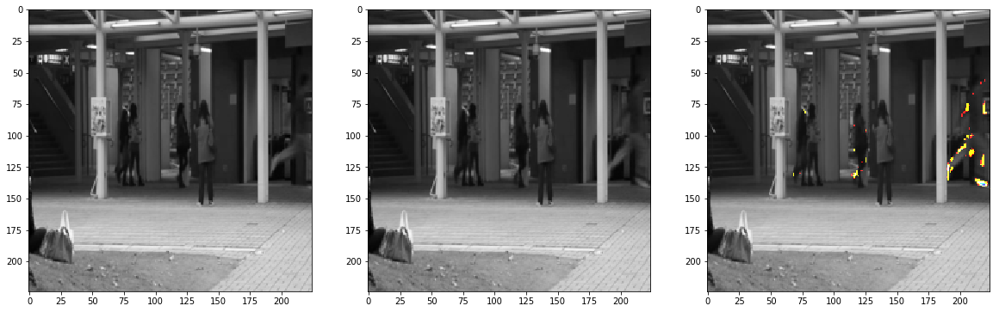

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


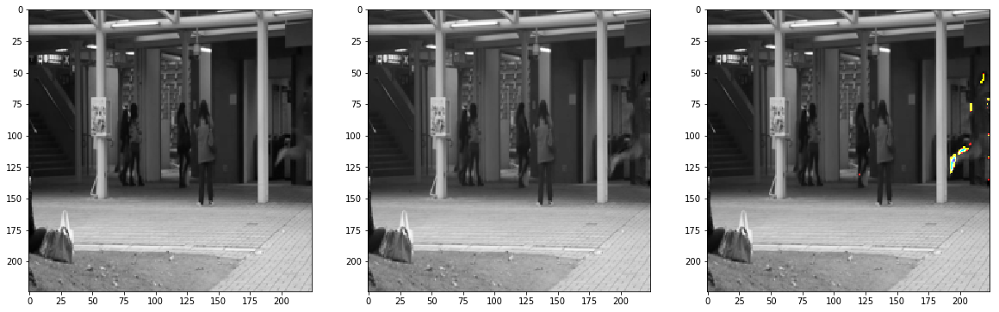

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


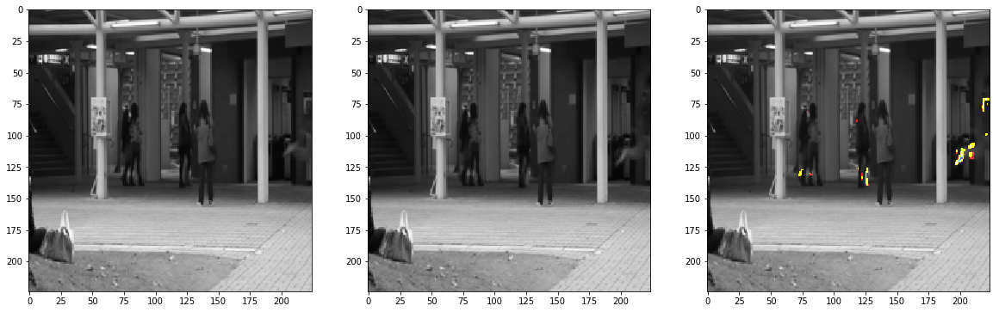

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


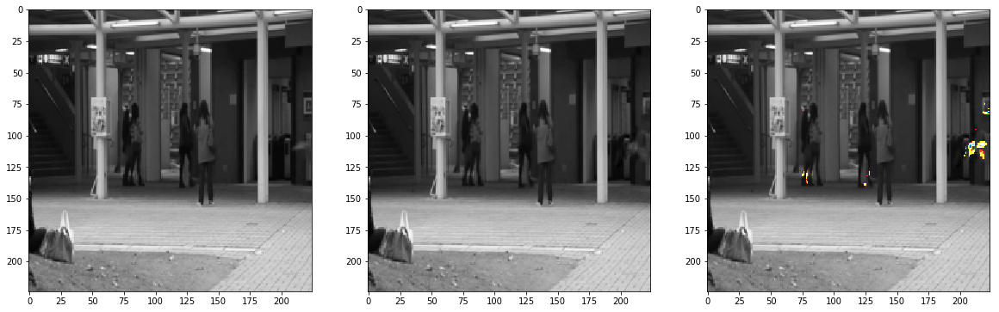

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


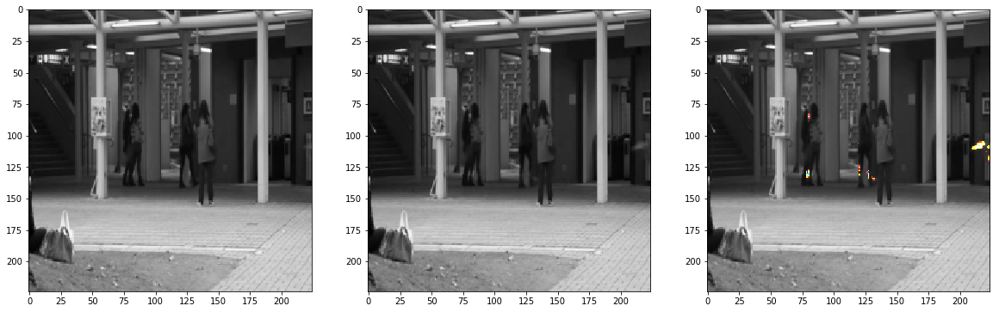

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


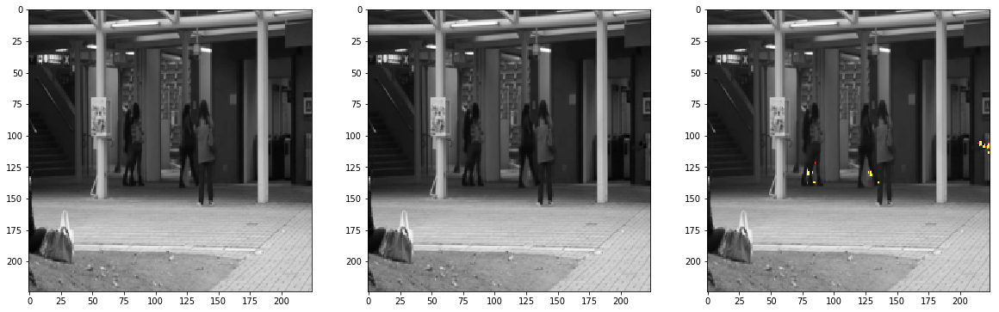

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


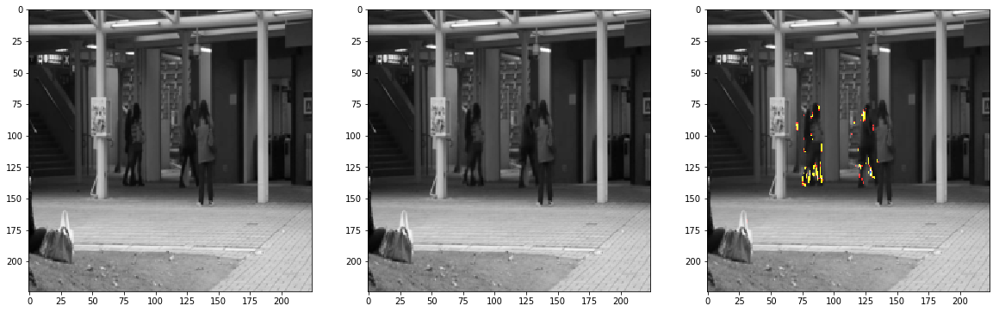

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


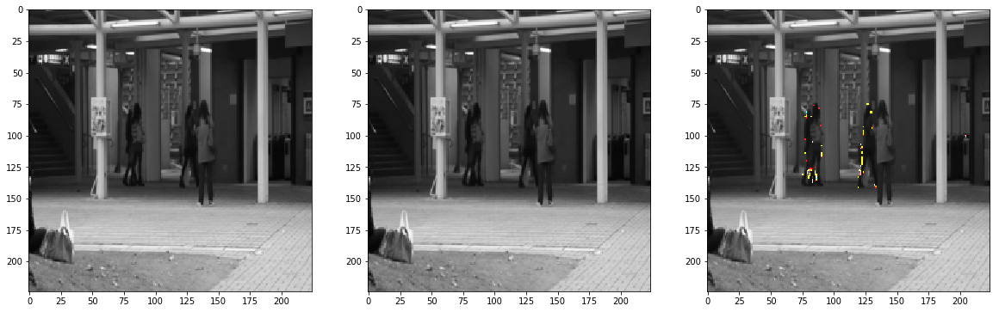

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


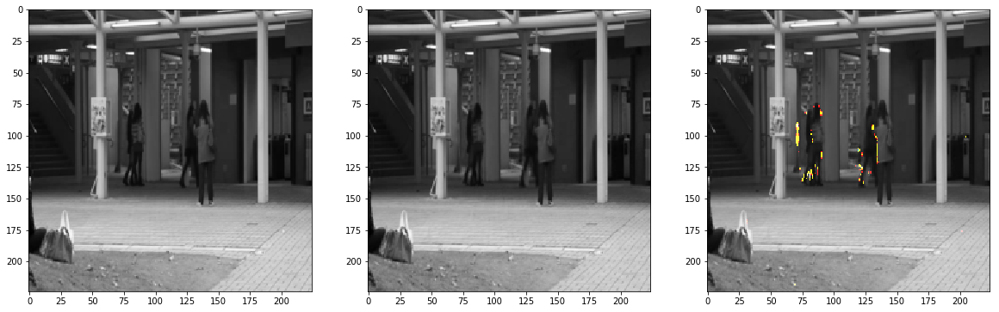

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


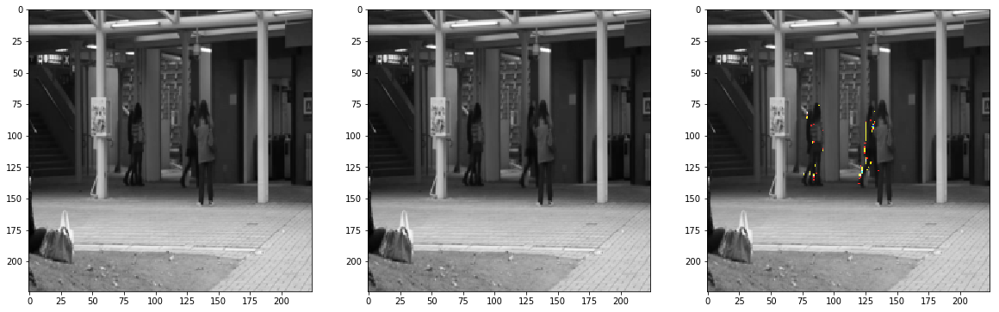

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


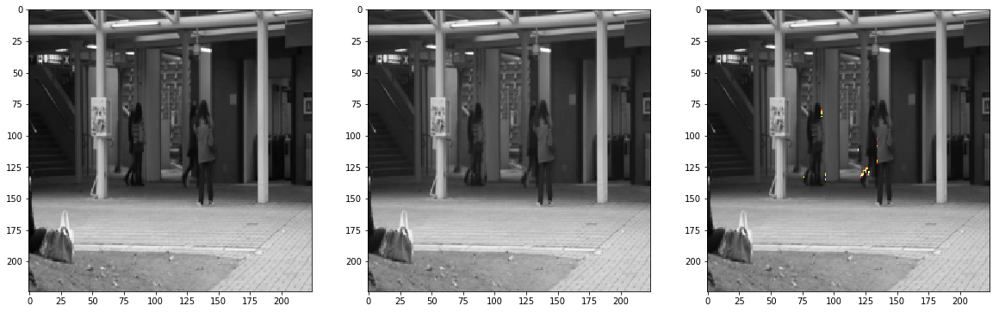

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


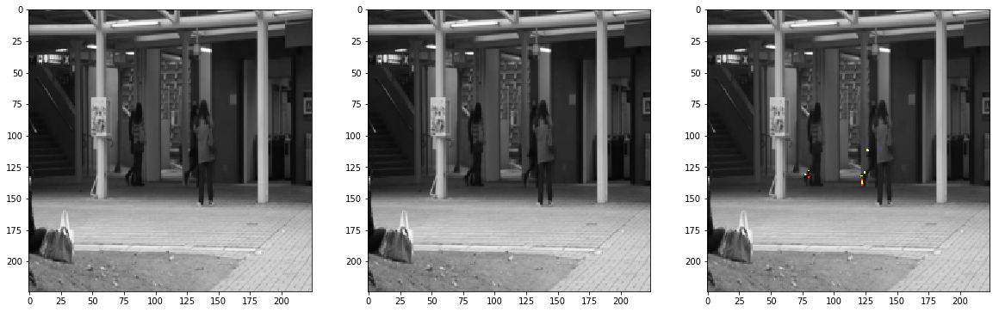

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


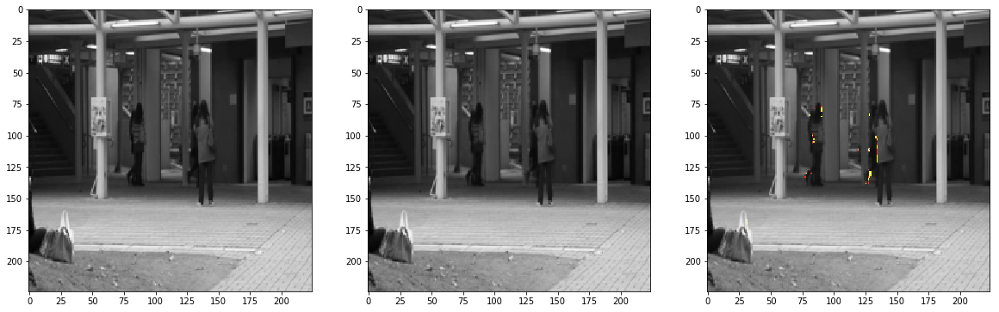

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


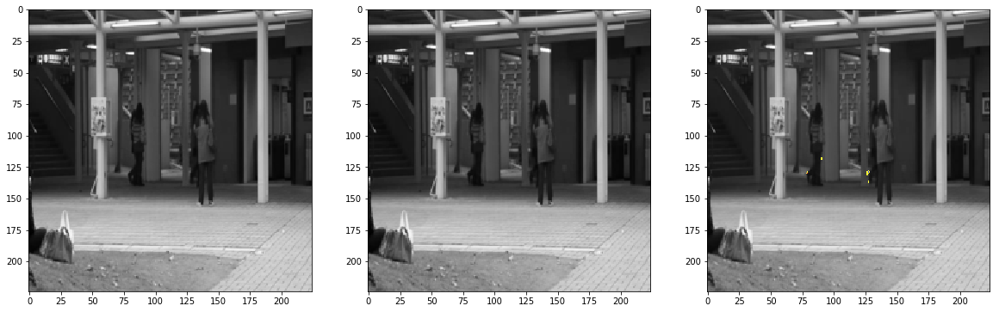

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


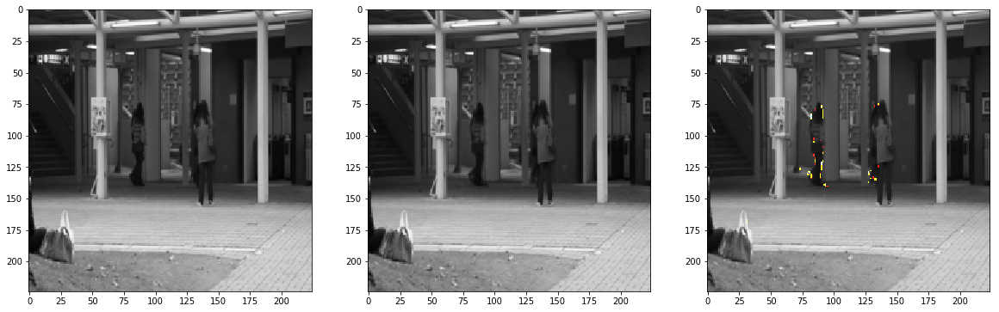

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


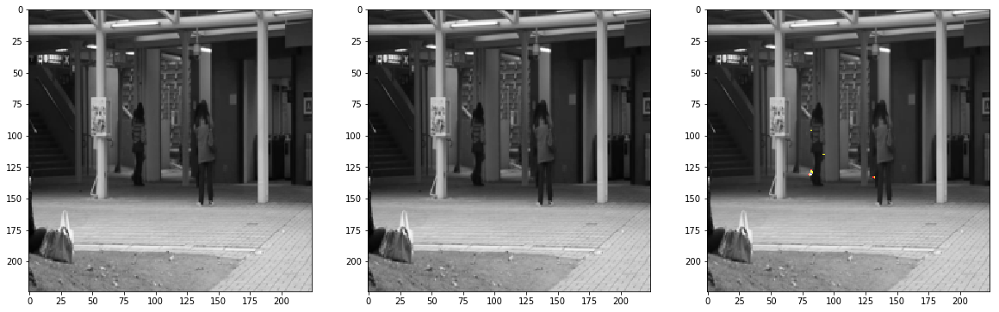

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


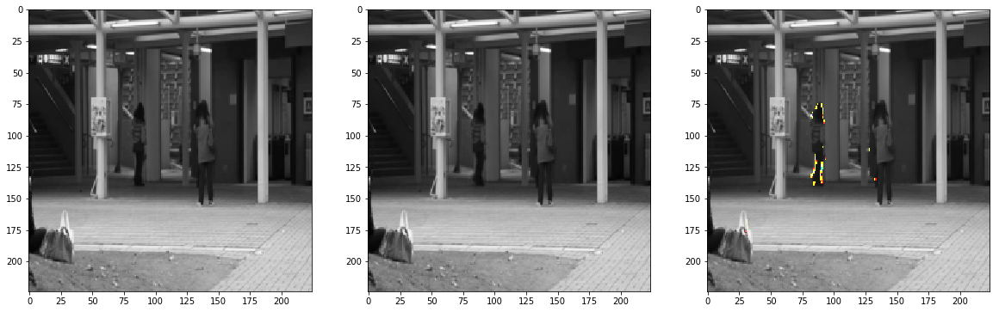

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


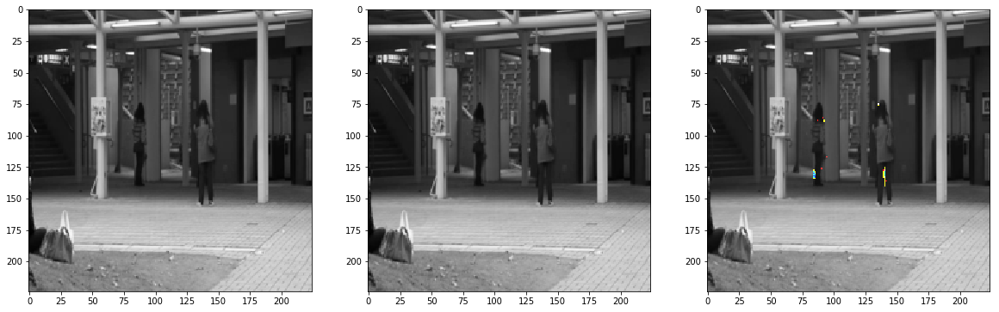

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


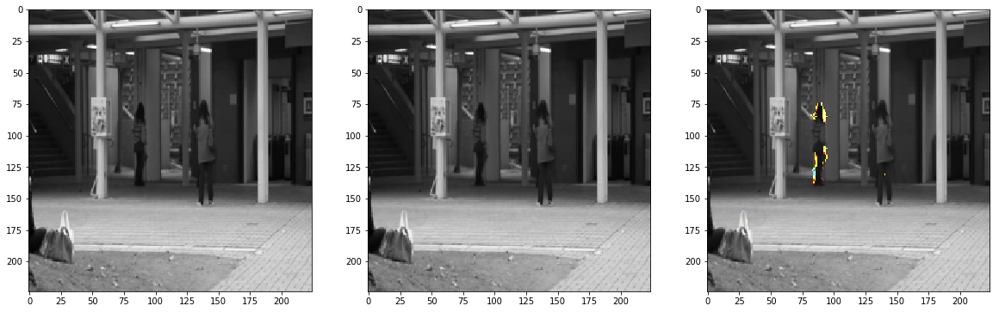

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


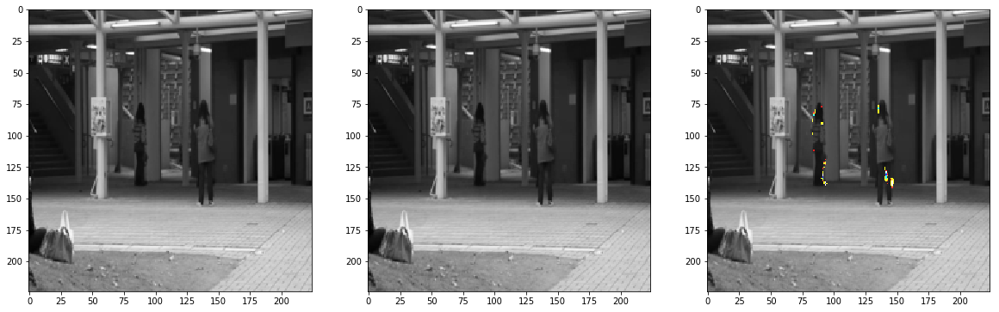

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


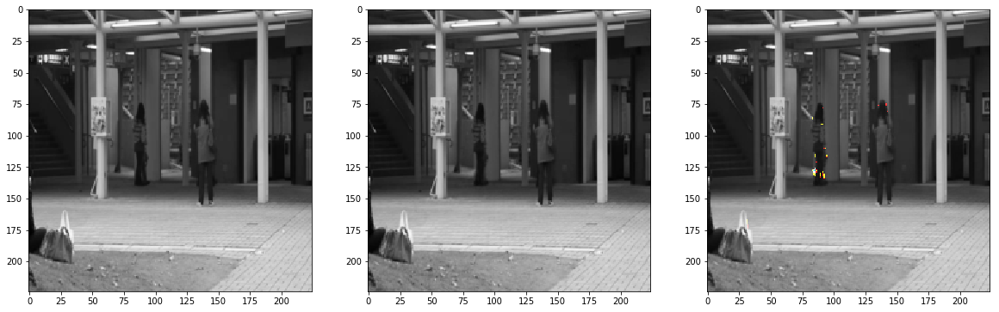

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


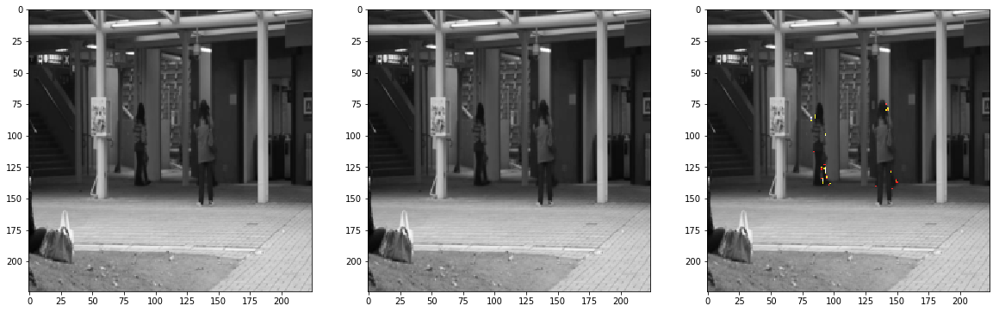

In [37]:
for i in range(20):
    for j in range(2) :
        plt.figure(figsize=(20,10))
        plt.subplot(1,3,1)
        plt.imshow(batch[i,j+1,:,:,0],cmap='gray')
        plt.subplot(1,3,2)
        plt.imshow(pred_batch[i,j,:,:,0],cmap='gray')
        plt.subplot(1,3,3)
        #ax = sns.heatmap(mse_batch[i,j,:,:,0], linewidth=0.5)
        cam = mse_batch[i,j,:,:,0]/np.max(mse_batch[i,j,:,:,0])
        heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
        heatmap[np.where(cam < 0.1)] = 0
        plt.imshow(heatmap*0.5 + pred_batch[i,j,:,:,:1])
        plt.show()
        